### Import libraries

In [1]:
import pandas as pd
import numpy as np
import missingno as msno

# Pandas warning messages (optional)
pd.options.mode.chained_assignment = None  #default='warn'

# Plot options
import matplotlib.pyplot as plt
import seaborn as sns
sns.palplot(sns.color_palette('deep'))
sns.set_style("whitegrid")
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Load data
#### The dataset was downloaded from [insideairbnb](http://insideairbnb.com/get-the-data.html) for the city of Austin, Date Compiled on March 17th, 2020. 
#### Let's import the dataset and take a look at the first few observations.

In [2]:
# import dataset
df = pd.read_csv('data/listings.csv', low_memory=False, index_col='id')
df.head()

,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2265,https://www.airbnb.com/rooms/2265,20200317143754,2020-03-17,Zen-East in the Heart of Austin (monthly rental),Zen East is situated in a vibrant & diverse mu...,This colorful and clean 1923 house was complet...,Zen East is situated in a vibrant & diverse mu...,none,NaN,A 2013 Genuine Buddy Scooter 125 may be availa...,5 min walk to Capitol Metro Rail (train that t...,"Several local restaurants, small clubs, music ...","Depending on your dates and arrival time, I am...",• Check-in time is 4 pm. Check out is 11 am. I...,NaN,NaN,https://a0.muscache.com/im/pictures/4740524/63...,NaN,2466,https://www.airbnb.com/users/show/2466,Paddy,2008-08-23,"Austin, Texas, United States",I am a long time resident of Austin. I earned ...,NaN,NaN,100%,t,https://a0.muscache.com/im/users/2466/profile_...,https://a0.muscache.com/im/users/2466/profile_...,East Downtown,3.0,3.0,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"Austin, TX, United States",East Downtown,78702,NaN,Austin,TX,78702.0,Austin,"Austin, TX",US,United States,30.27750,-97.71398,f,House,Entire home/apt,4,2.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$225.00,NaN,NaN,$500.00,$100.00,4,$30.00,30,90,30,30,90,90,30.0,90.0,7 months ago,t,0,0,0,0,2020-03-17,24,0,2009-03-17,2019-03-16,93.0,9.0,10.0,10.0,10.0,8.0,9.0,f,NaN,"{""Texas State""}",f,f,strict_14_with_grace_period,f,f,3,2,1,0,0.18
5245,https://www.airbnb.com/rooms/5245,20200317143754,2020-03-17,"Eco friendly, Colorful, Clean, Cozy monthly share",Situated in a vibrant & diverse multicultural ...,"This green, colorful, clean and cozy house was...",Situated in a vibrant & diverse multicultural ...,none,NaN,Please note: A two story studio was built in t...,NaN,NaN,"I should be available, upon your arrival, to a...",A brief profile for all guests along with phot...,NaN,NaN,https://a0.muscache.com/im/pictures/5167505/b3...,NaN,2466,https://www.airbnb.com/users/show/2466,Paddy,2008-08-23,"Austin, Texas, United States",I am a long time resident of Austin. I earned ...,NaN,NaN,100%,t,https://a0.muscache.com/im/users/2466/profile_...,https://a0.muscache.com/im/users/2466/profile_...,East Down

In [3]:
# shape
df.shape

(11668, 105)

The Airbnb dataset for Austin, TX consists of 106 features and 11668 observations. We need to look at these features closely and drop the ones that do not help our model to predict the rental prices. 

In [4]:
# specifying max_cols=df.shape[1] so we can look at the columns in df.info()
df.info(max_cols=df.shape[1])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11668 entries, 2265 to 42931550
Data columns (total 105 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   listing_url                                   11668 non-null  object 
 1   scrape_id                                     11668 non-null  int64  
 2   last_scraped                                  11668 non-null  object 
 3   name                                          11668 non-null  object 
 4   summary                                       11244 non-null  object 
 5   space                                         9083 non-null   object 
 6   description                                   11461 non-null  object 
 7   experiences_offered                           11668 non-null  object 
 8   neighborhood_overview                         7937 non-null   object 
 9   notes                                         5553 non

In [5]:
# ordering null columns based on the number of null values in each column
print('Columns with Null values by their count:')
df.isnull().sum().sort_values(ascending=False)[:25]

Columns with Null values by their count:


neighbourhood_group_cleansed    11668
medium_url                      11668
xl_picture_url                  11668
thumbnail_url                   11668
license                         11621
square_feet                     11476
monthly_price                   10931
weekly_price                    10793
notes                            6115
access                           4917
transit                          4370
host_about                       4099
interaction                      3862
house_rules                      3759
neighborhood_overview            3731
host_response_time               3462
host_response_rate               3462
security_deposit                 3100
host_acceptance_rate             2765
review_scores_location           2675
review_scores_value              2674
review_scores_checkin            2670
review_scores_communication      2670
review_scores_accuracy           2669
review_scores_cleanliness        2669
dtype: int64

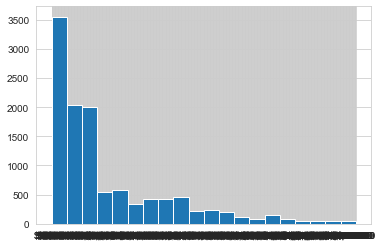

In [6]:
df['price'].hist(bins=20)

In [7]:
#sns.pairplot(df)

Using MSNO to look at Misisng Values in 25 columns visually.

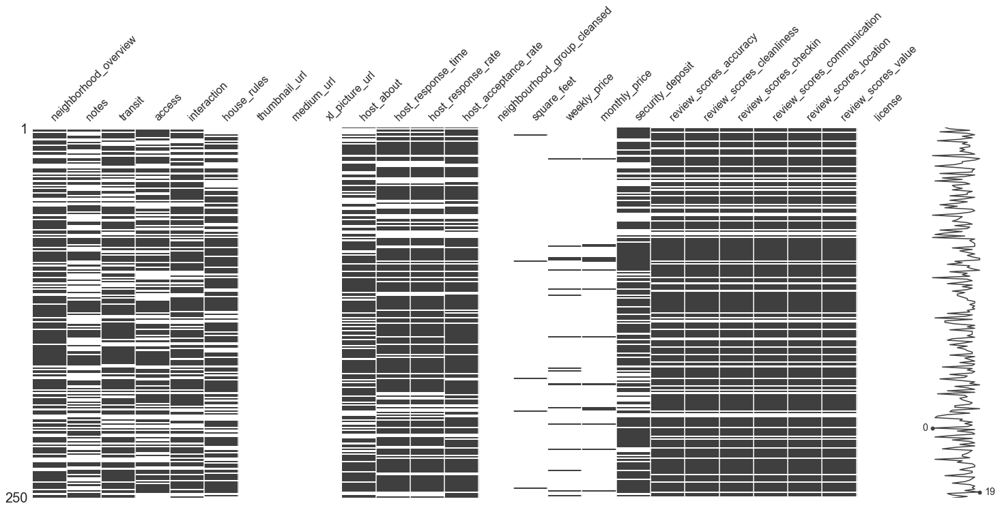

In [8]:
filtered_data = msno.nullity_filter(df, filter='bottom', n=25, p=0.999) # or filter='top'
msno.matrix(filtered_data.sample(250))

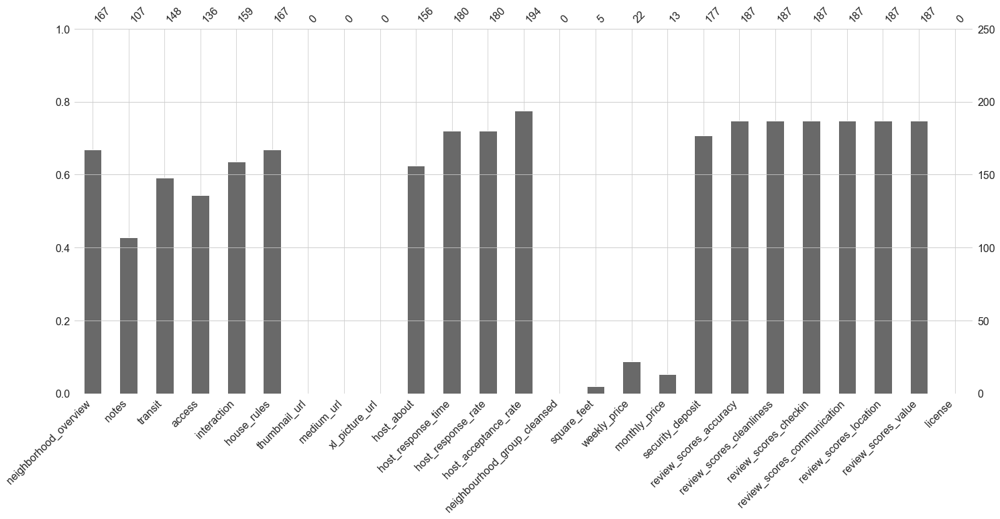

In [9]:
msno.bar(filtered_data.sample(250))

Features like 'square_feet', 'monthly_price' or 'weekly_price' have a lot of NULL values but we can use bedroom, bathroom, and accommodates data as a replacement for space size and also use 'price' for our prediction instead of 'monthly_price' or 'weekly_price'. 

#### Price (1):

In [10]:
df[['price','monthly_price', 'weekly_price']]

,price,monthly_price,weekly_price
id,,,
2265,$225.00,NaN,NaN
5245,$100.00,NaN,NaN
5456,$95.00,NaN,NaN
5769,$40.00,NaN,$160.00
6413,$99.00,"$1,900.00",$700.00
6448,$139.00,"$1,499.00",$649.00
8502,$40.00,"$1,100.00",$310.00
14913,$300.00,NaN,NaN
21126,$550.00,NaN,NaN


In [11]:
# Looking at describe() to get some insights on price and other numerical values
df.describe()

,scrape_id,thumbnail_url,medium_url,xl_picture_url,host_id,host_listings_count,host_total_listings_count,neighbourhood_cleansed,neighbourhood_group_cleansed,zipcode,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,guests_included,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,1.166800e+04,0.0,0.0,0.0,1.166800e+04,11666.000000,11666.000000,11668.000000,0.0,11580.000000,11668.000000,11668.000000,11668.000000,11655.000000,11653.000000,11601.000000,192.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,11668.000000,9017.000000,8999.000000,8999.000000,8998.000000,8998.000000,8993.000000,8994.000000,11668.000000,11668.000000,11668.000000,11668.000000,9146.000000
mean,2.020032e+13,NaN,NaN,NaN,7.673078e+07,66.963398,66.963398,78722.143469,NaN,78721.910535,30.278100,-97.751143,4.708348,1.543930,1.786407,2.544005,1209.765625,2.427580,5.282911,624.495972,4.740744,5.858330,704.373672,709.280939,5.141969,707.106831,13.287624,27.030254,41.590247,134.348046,31.714433,12.263113,95.971831,9.763196,9.607512,9.838964,9.848188,9.779162,9.587725,13.572506,12.477288,0.715975,0.350531,1.721717
std,2.511826e+00,NaN,NaN,NaN,8.628560e+07,281.215856,281.215856,20.689544,NaN,20.859859,0.057423,0.056388,3.252291,0.873916,1.273369,2.726590,818.642672,2.743511,16.622890,528.773959,15.609035,16.525128,517.836372,514.097341,15.846069,515.684542,12.028133,23.669473,35.551582,134.643100,63.579209,22.515216,7.210971,0.705326,0.838195,0.611808,0.600158,0.615760,0.794404,41.256138,41.041238,2.807207,3.948567,2.122986
min,2.020032e+13,NaN,NaN,NaN,2.300000e+01,0.000000,0.000000,78701.000000,NaN,78617.000000,30.118850,-98.053550,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.020032e+13,NaN,NaN,NaN,8.761906e+06,1.000000,1.000000,78704.000000,NaN,78703.000000,30.244320,-97.767315,2.000000,1.000000,1.000000,1.000000,600.000000,1.000000,1.000000,29.000000,1.000000,1.000000,30.000000,30.000000,1.000000,30.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,95.000000,10.000000,9.000000,10.000000,10.000000,10.000000,9.000000,1.000000,1.000000,0.000000,0.000000,0.260000
50%,2.020032e+13,NaN,NaN,NaN,3.939813e+07,1.000000,1.000000,78717.000000,NaN,78705.000000,30.266820,-97.744810,4.000000,1.000000,1.000000,2.000000,1125.000000,1.000000,2.000000,1125.000000,2.000000,2.000000,1125.000000,1125.000000,2.000000,1125.000000,14.000000,30.000000,46.000000,87.000000,7.000000,2.000000,98.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,0.000000,0.000000,1.000000
75%,2.020032e+13,NaN,NaN,NaN,1.185659e+08,4.000000,4.000000,78744.000000,NaN,78744.000000,30.298533,-97.721360,6.000000,2.000000,2.000000,3.000000,1600.000000,2.000000,2.000000,1125.000000,2.000000,3.000000,1125.000000,1125.000000,3.000000,1125.000000,26.000000,50.000000,76.000000,269.000000,32.000000,16.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000,3.000000,1.000000,0.000000,2.510000
max,2.020032e+13,NaN,NaN,NaN,3.416244e+08,2016.000000,2016.000000,78759.000000,NaN,78767.000000,3

Notice that 'price' is not included on the describe() above! Let's investigate why 'price' did not show up!

In [12]:
# describe for price
df['price'].head()

id
2265    $225.00
5245    $100.00
5456     $95.00
5769     $40.00
6413     $99.00
Name: price, dtype: object

'price' is type object and needs to be transformed to the correct data type.

In [13]:
# Convert price to from currency to float
df['price'] = df['price'].str.replace('$', '').str.replace(',', '').astype(float, 2)

In [14]:
# Verify price type is float
df['price'].head()

id
2265    225.0
5245    100.0
5456     95.0
5769     40.0
6413     99.0
Name: price, dtype: float64

In [15]:
df.price.describe()

count    11668.000000
mean       484.237830
std       1480.352627
min          0.000000
25%         80.000000
50%        149.000000
75%        300.000000
max      14298.000000
Name: price, dtype: float64

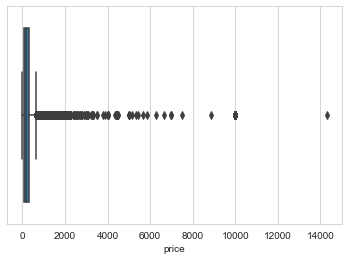

In [16]:
sns.boxplot(df['price'])

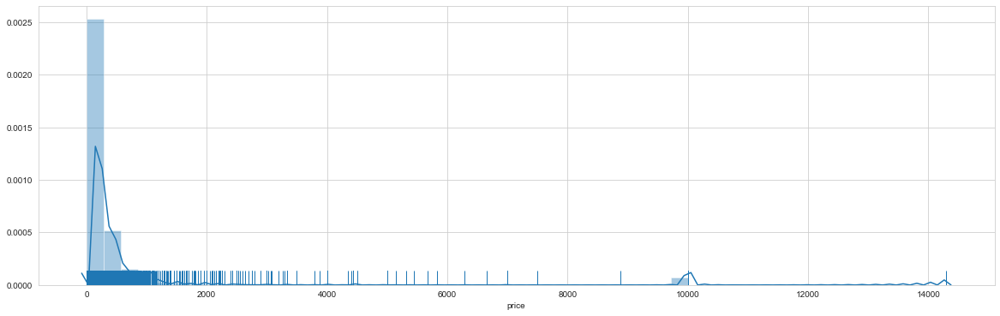

In [17]:
plt.figure(figsize=(20,6))
sns.distplot(df['price'], rug=True)

In [18]:
df['price'].isnull().sum()

0

In [19]:
df[df['price']==0][['bedrooms', 'bathrooms', 'price', 'accommodates', 'zipcode', 'listing_url']]

,bedrooms,bathrooms,price,accommodates,zipcode,listing_url
id,,,,,,
20269052,1.0,1.0,0.0,3,78701.0,https://www.airbnb.com/rooms/20269052
20541331,1.0,1.0,0.0,2,78704.0,https://www.airbnb.com/rooms/20541331
21378172,4.0,2.0,0.0,10,78704.0,https://www.airbnb.com/rooms/21378172


In [20]:
df['price'].replace(0.0, np.nan, inplace=True)
df['price'].fillna(df.groupby(df['accommodates'])['price'].transform('median'), inplace=True)

In [21]:
print(df.loc[21378172]['price'])
print(df.loc[20541331]['price'])
print(df.loc[20269052]['price'])

450.0
80.0
100.0


In [22]:
'''df.at[21378172, 'price'] = 435
df.at[20541331, 'price'] = 130
df.at[20269052, 'price'] = 104'''

"df.at[21378172, 'price'] = 435\ndf.at[20541331, 'price'] = 130\ndf.at[20269052, 'price'] = 104"

In [23]:
# All these rentals for $1 /night are for Hurrican Harvey Refugees and haven't been updated since 2017 so we can drop them.
df[df['price']==1][['bedrooms', 'bathrooms', 'price', 'listing_url']]

,bedrooms,bathrooms,price,listing_url
id,,,,
20654658,0.0,0.0,1.0,https://www.airbnb.com/rooms/20654658
20674436,2.0,1.0,1.0,https://www.airbnb.com/rooms/20674436
20708014,1.0,1.5,1.0,https://www.airbnb.com/rooms/20708014
20780987,1.0,1.0,1.0,https://www.airbnb.com/rooms/20780987


In [24]:
df= df[df['price'] !=1.0]

In [25]:
#df['price'].replace(1.0, np.nan, inplace=True)
#df.dropna(inplace=True) # Will drop NaN values at the end

In [26]:
df[df['price']==1][['bedrooms', 'bathrooms', 'price', 'listing_url']]

,bedrooms,bathrooms,price,listing_url
id,,,,


In [27]:
df[df['price']==5][['bedrooms', 'bathrooms', 'price', 'listing_url']]

,bedrooms,bathrooms,price,listing_url
id,,,,
19840835,0.0,1.0,5.0,https://www.airbnb.com/rooms/19840835


In [28]:
df= df[df['price'] !=5.0]

In [29]:
df[df['price']==10][['bedrooms', 'bathrooms', 'price', 'listing_url']]

,bedrooms,bathrooms,price,listing_url
id,,,,
10451030,1.0,1.0,10.0,https://www.airbnb.com/rooms/10451030
20647325,1.0,1.0,10.0,https://www.airbnb.com/rooms/20647325
20691399,1.0,1.0,10.0,https://www.airbnb.com/rooms/20691399
20713150,1.0,1.0,10.0,https://www.airbnb.com/rooms/20713150
21946737,1.0,1.0,10.0,https://www.airbnb.com/rooms/21946737
24208274,1.0,1.0,10.0,https://www.airbnb.com/rooms/24208274
32766208,5.0,5.5,10.0,https://www.airbnb.com/rooms/32766208
35315186,0.0,1.0,10.0,https://www.airbnb.com/rooms/35315186
36770125,0.0,1.0,10.0,https://www.airbnb.com/rooms/36770125


In [30]:
df= df[df['price'] !=10.0]

In [31]:
df[df['price']==14][['bedrooms', 'bathrooms', 'price', 'listing_url']]
# All of these listings are for camp sites and can be marked as NaN and dropped later at the end

,bedrooms,bathrooms,price,listing_url
id,,,,
372254,1.0,1.0,14.0,https://www.airbnb.com/rooms/372254
685447,1.0,1.0,14.0,https://www.airbnb.com/rooms/685447
685448,1.0,1.0,14.0,https://www.airbnb.com/rooms/685448
685451,0.0,1.0,14.0,https://www.airbnb.com/rooms/685451
936496,1.0,1.0,14.0,https://www.airbnb.com/rooms/936496
945803,0.0,1.0,14.0,https://www.airbnb.com/rooms/945803
968760,10.0,1.5,14.0,https://www.airbnb.com/rooms/968760
968817,10.0,1.0,14.0,https://www.airbnb.com/rooms/968817
12165731,1.0,1.0,14.0,https://www.airbnb.com/rooms/12165731


In [32]:
df= df[df['price'] !=14.0]

In [33]:
df[df['price']==15][['bedrooms', 'bathrooms', 'price', 'listing_url']]
# These are also camp sites listings and can be dropped

,bedrooms,bathrooms,price,listing_url
id,,,,
15217595,0.0,0.0,15.0,https://www.airbnb.com/rooms/15217595
18849155,1.0,1.0,15.0,https://www.airbnb.com/rooms/18849155
39676879,0.0,1.0,15.0,https://www.airbnb.com/rooms/39676879


In [34]:
df= df[df['price'] !=15.0]

In [35]:
df[df['price']==16][['bedrooms', 'bathrooms', 'price', 'listing_url']]
# chekced url's randomly and these listings are reliable

,bedrooms,bathrooms,price,listing_url
id,,,,
12336677,1.0,1.0,16.0,https://www.airbnb.com/rooms/12336677
14221592,1.0,2.0,16.0,https://www.airbnb.com/rooms/14221592
14463342,1.0,2.0,16.0,https://www.airbnb.com/rooms/14463342
14483719,1.0,2.0,16.0,https://www.airbnb.com/rooms/14483719
15034794,1.0,2.0,16.0,https://www.airbnb.com/rooms/15034794
16649075,1.0,1.0,16.0,https://www.airbnb.com/rooms/16649075
18787194,1.0,1.0,16.0,https://www.airbnb.com/rooms/18787194
18807173,1.0,1.0,16.0,https://www.airbnb.com/rooms/18807173
20439382,1.0,1.0,16.0,https://www.airbnb.com/rooms/20439382


In [36]:
df[df['price'] ==15]

,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [37]:
#df.drop(df.index[[19840835, 10451030, 20647325, 20691399, 20713150, 21946737, 24208274, 32766208, 35315186, 36770125,
#                 372254, 685447, 685448, 685451, 936496, 945803, 968760, 968817, 12165731, 30123710,
#                 15217595, 18849155, 39676879]], axis=1, inplace=True)

In [38]:
df[df['price']<= 20]['property_type'].value_counts()

Apartment    37
House        10
Tipi          2
Townhouse     1
Camper/RV     1
Other         1
Cottage       1
Bungalow      1
Name: property_type, dtype: int64

In [39]:
df.price.describe()

count    11641.000000
mean       485.390688
std       1481.881108
min         16.000000
25%         80.000000
50%        149.000000
75%        300.000000
max      14298.000000
Name: price, dtype: float64

Defined a mask for price based on below 25% quartile as 'low', below 50% as 'med' and the rest was set as 'high'

In [40]:
'''
price_bins=[]
for price in df.price:
    if price < 81:
        price_bins.append('low')
    if price < 150:
        price_bins.append('med')
    else:
        price_bins.append('high')
'''

"\nprice_bins=[]\nfor price in df.price:\n    if price < 81:\n        price_bins.append('low')\n    if price < 150:\n        price_bins.append('med')\n    else:\n        price_bins.append('high')\n"

In [41]:
#price_bins = pd.cut(df['price'], bins=10)
#price_bins.value_counts().hist()

In [42]:
#[[x,price_bins.count(x)] for x in set(price_bins)]

In [43]:
#df['price_bins'] = pd.Series(price_bins)

In [44]:
#df[['price', 'price_bins']]

In [45]:
#print(df['price_bins'].value_counts())
#df['price_bins'].value_counts().plot(kind='bar');

In [46]:
'''
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11, 8)
sns.scatterplot(data=df, x='longitude', y='latitude', hue='price_bins', palette='Dark2', ax=ax);
'''

"\nsns.set_style('ticks')\nfig, ax = plt.subplots()\nfig.set_size_inches(11, 8)\nsns.scatterplot(data=df, x='longitude', y='latitude', hue='price_bins', palette='Dark2', ax=ax);\n"

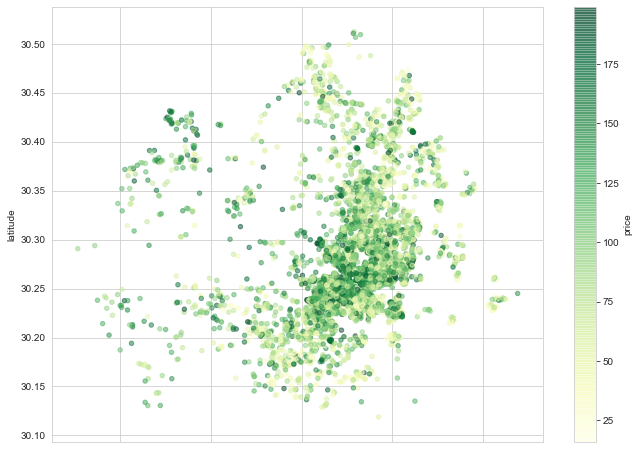

In [47]:
df[df['price']<200].plot.scatter(x='longitude', y='latitude', c='price', figsize=(11,8), cmap='YlGn', alpha=0.5);

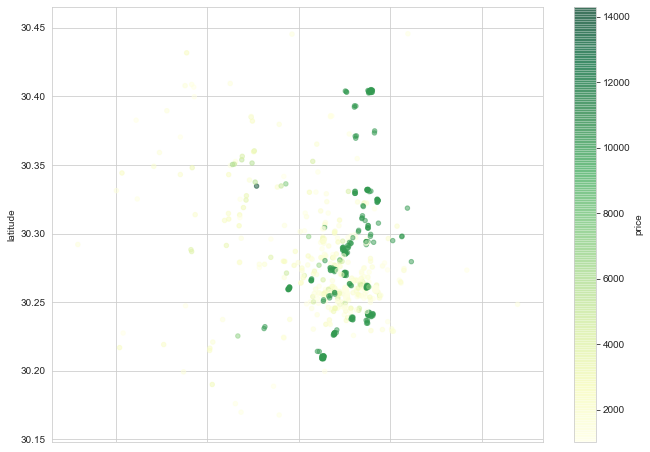

In [48]:
df[df['price']>1000].plot.scatter(x='longitude', y='latitude', c='price', figsize=(11,8), cmap='YlGn', alpha=0.5);

In [49]:
import plotly.express as px
fig = px.scatter(df, x="longitude", y="latitude", color='price', hover_data=['property_type'])
fig.show()

#### Property Type:

House                 0.437935
Apartment             0.266901
Condominium           0.091573
Guesthouse            0.046216
Townhouse             0.035736
Bungalow              0.025599
Guest suite           0.023194
Serviced apartment    0.014260
Loft                  0.011855
Camper/RV             0.007731
Cottage               0.005841
Tiny house            0.005498
Resort                0.004123
Villa                 0.003780
Boutique hotel        0.003350
Other                 0.003350
Bed and breakfast     0.002663
Hostel                0.002148
Aparthotel            0.002062
Cabin                 0.001374
Farm stay             0.000773
Tent                  0.000773
Boat                  0.000515
Treehouse             0.000430
Barn                  0.000344
Yurt                  0.000344
Dome house            0.000258
Hotel                 0.000258
Tipi                  0.000258
Houseboat             0.000258
Bus                   0.000172
Chalet                0.000172
Nature l

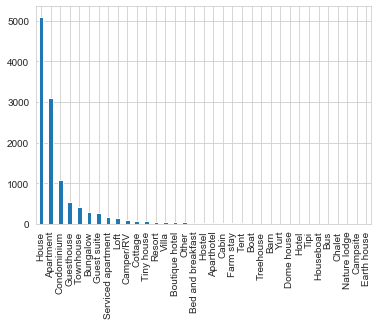

In [50]:
# Let's look at the property_type distribution
print(df['property_type'].value_counts(normalize=True))
df['property_type'].value_counts().plot(kind='bar');

Apartment         0.956349
Boutique hotel    0.015873
House             0.015873
Townhouse         0.003968
Loft              0.003968
Villa             0.003968
Name: property_type, dtype: float64


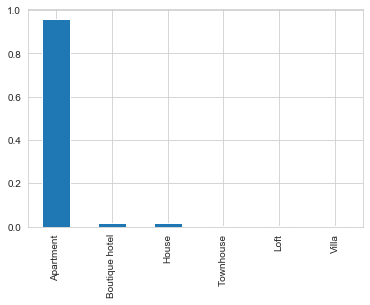

In [51]:
property_outliers = df[df['price'] >= 8000]['property_type'].value_counts(normalize=True)
print(property_outliers)
property_outliers.plot(kind='bar');

In [52]:
df.groupby(df['property_type']== 'Apartment')['price'].median()

property_type
False    150.0
True     135.0
Name: price, dtype: float64

In [53]:
apartment = df[df['property_type']== 'Apartment'][['bedrooms', 'bathrooms', 'accommodates', 'price', 'listing_url']]
apartment[apartment['price'] >=8000].sort_values('accommodates', ascending=False)
# I checked some of these listings randomly and only 1 of them has the price of $8,000/night. I will replace the price
# with the median price associated to the accommodates rate

,bedrooms,bathrooms,accommodates,price,listing_url
id,,,,,
37997840,4.0,2.0,10,10000.0,https://www.airbnb.com/rooms/37997840
37998870,4.0,2.0,10,10000.0,https://www.airbnb.com/rooms/37998870
41718441,4.0,2.0,10,10000.0,https://www.airbnb.com/rooms/41718441
39560085,2.0,1.0,6,10000.0,https://www.airbnb.com/rooms/39560085
39580699,2.0,2.0,6,10000.0,https://www.airbnb.com/rooms/39580699
40800722,2.0,1.0,6,10000.0,https://www.airbnb.com/rooms/40800722
40638804,2.0,2.0,6,10000.0,https://www.airbnb.com/rooms/40638804
40637767,2.0,2.0,6,10000.0,https://www.airbnb.com/rooms/40637767
40306829,2.0,1.5,6,10000.0,https://www.airbnb.com/rooms/40306829


In [54]:
df[df['property_type']== 'Apartment']['price'].median()

135.0

id
36868625    14298.0
36880518     6291.0
36874172     5832.0
36909759     5669.0
39272801     5443.0
36915288     5139.0
36868497     4999.0
35569192     4350.0
35936939     4000.0
36874378     3999.0
36868035     3499.0
36903761     3266.0
36868599     3079.0
36874426     2749.0
33374106     2699.0
37078495     2639.0
36873295     2528.0
39272850     2528.0
17576092     2500.0
36904204     1899.0
35119543     1699.0
35936760     1388.0
22408939     1300.0
35119272     1200.0
11655929     1200.0
30344991     1125.0
20458467     1050.0
35839045     1000.0
1588655       975.0
9694801       975.0
21164390      900.0
41794019      666.0
904354        650.0
7478179       600.0
17316306      550.0
19017960      489.0
20760311      482.0
21162776      420.0
27088626      400.0
18528005      375.0
26389105      350.0
42493257      290.0
1953384       219.0
23464327       30.0
Name: price, dtype: float64


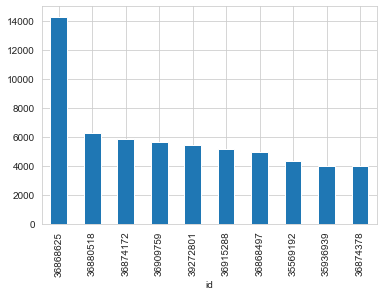

In [55]:
villa = df[df['property_type'] == 'Villa']['price'].sort_values(ascending=False)
print(villa)
villa[:10].plot(y='price', kind='bar', fig=(20,8))

In [56]:
df[df['property_type'] == 'Villa'][['price', 'listing_url']].sort_values('price', ascending=False)

,price,listing_url
id,,
36868625,14298.0,https://www.airbnb.com/rooms/36868625
36880518,6291.0,https://www.airbnb.com/rooms/36880518
36874172,5832.0,https://www.airbnb.com/rooms/36874172
36909759,5669.0,https://www.airbnb.com/rooms/36909759
39272801,5443.0,https://www.airbnb.com/rooms/39272801
36915288,5139.0,https://www.airbnb.com/rooms/36915288
36868497,4999.0,https://www.airbnb.com/rooms/36868497
35569192,4350.0,https://www.airbnb.com/rooms/35569192
35936939,4000.0,https://www.airbnb.com/rooms/35936939


In [57]:
df.at[36868625, 'price'] = 9630

In [58]:
df[df['property_type'] == 'Villa'][['price', 'listing_url']].sort_values('price', ascending=False)

,price,listing_url
id,,
36868625,9630.0,https://www.airbnb.com/rooms/36868625
36880518,6291.0,https://www.airbnb.com/rooms/36880518
36874172,5832.0,https://www.airbnb.com/rooms/36874172
36909759,5669.0,https://www.airbnb.com/rooms/36909759
39272801,5443.0,https://www.airbnb.com/rooms/39272801
36915288,5139.0,https://www.airbnb.com/rooms/36915288
36868497,4999.0,https://www.airbnb.com/rooms/36868497
35569192,4350.0,https://www.airbnb.com/rooms/35569192
35936939,4000.0,https://www.airbnb.com/rooms/35936939


In [59]:
df[df['property_type'] == 'Villa']['price'].median()

1344.0

In [60]:
df[df['property_type'] == 'House']['price'].value_counts().sort_index(ascending=False)

10000.0      3
8880.0       1
7500.0       1
7000.0       1
6660.0       1
5314.0       1
5000.0       2
4501.0       1
4500.0       1
4440.0      11
4399.0       1
4000.0       2
3999.0       2
3799.0       1
3499.0       1
3330.0       4
3300.0       1
3200.0       1
3072.0       1
3025.0       1
3000.0       3
2900.0       1
2899.0       1
2800.0       1
2749.0       2
2598.0       1
2500.0       6
2499.0       1
2495.0       1
2419.0       2
2418.0       1
2400.0       1
2399.0       1
2300.0       1
2250.0       5
2220.0       3
2214.0       2
2200.0       2
2150.0       2
2125.0       1
2100.0       2
2096.0       1
2088.0       1
2000.0      19
1999.0       4
1950.0       1
1900.0       4
1858.0       1
1850.0       1
1814.0       1
1800.0       4
1799.0       1
1795.0       2
1780.0       1
1750.0       2
1700.0       5
1699.0       1
1665.0       5
1650.0       1
1633.0       2
1600.0       6
1599.0       3
1596.0       1
1595.0       2
1580.0       1
1554.0       1
1540.0    

In [61]:
df[df['property_type'] == 'House']['price'].median()

174.0

In [62]:
#pd.options.display.max_rows = 60

In [63]:
df.groupby(['property_type', 'zipcode'])['price'].median()

property_type       zipcode
Aparthotel          78701.0     859.0
                    78702.0    1075.0
Apartment           78653.0     140.0
                    78660.0     110.0
                    78701.0     227.0
                    78702.0     200.0
                    78703.0     175.0
                    78704.0     159.5
                    78705.0     130.0
                    78712.0     500.0
                    78717.0      60.0
                    78721.0      72.0
                    78722.0     100.0
                    78723.0      95.0
                    78726.0      50.0
                    78727.0      70.0
                    78728.0      65.0
                    78729.0      80.0
                    78730.0     104.5
                    78731.0      90.0
                    78732.0      60.0
                    78733.0     112.5
                    78734.0     134.0
                    78735.0      99.0
                    78736.0      87.5
                    78

In [64]:
df.zipcode.isnull().sum()

85

In [65]:
df.groupby(['property_type'])['price'].median().sort_values(ascending=False)

property_type
Villa                 1344.0
Aparthotel             859.0
Resort                 472.0
Dome house             450.0
Hotel                  425.0
Chalet                 389.5
Boutique hotel         299.0
Houseboat              250.0
Serviced apartment     189.0
Nature lodge           180.0
Loft                   180.0
House                  174.0
Boat                   150.0
Bungalow               150.0
Cabin                  142.5
Condominium            142.5
Bed and breakfast      137.0
Apartment              135.0
Townhouse              134.0
Farm stay              130.0
Cottage                130.0
Treehouse              111.0
Guesthouse             110.0
Barn                   106.5
Yurt                   100.0
Other                  100.0
Tent                   100.0
Earth house             95.0
Guest suite             89.0
Tiny house              85.0
Camper/RV               75.0
Bus                     69.0
Hostel                  45.0
Campsite                40.0


In [66]:
df['price'].replace(10000.0, np.nan, inplace=True)
df['price'].fillna(df.groupby(['property_type'])['price'].transform('median'), inplace=True)

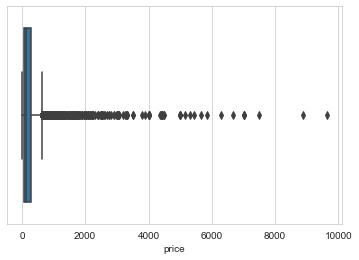

In [67]:
sns.boxplot(df['price'])

In [68]:
mask = df[df['price']>=8000]['price']

In [69]:
df['price'].replace(mask, np.nan, inplace=True)
df['price'].fillna(df.groupby(['property_type'])['price'].transform('median'), inplace=True)

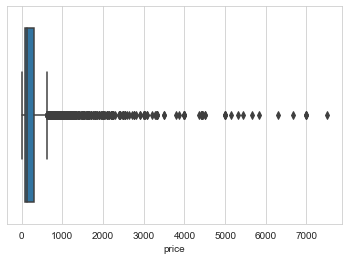

In [70]:
sns.boxplot(df['price'])

In [71]:
df['price'].describe()

count    11641.000000
mean       271.526587
std        431.591511
min         16.000000
25%         80.000000
50%        139.000000
75%        296.000000
max       7500.000000
Name: price, dtype: float64

#### Room Type:

Entire home/apt    0.758698
Private room       0.223349
Shared room        0.013573
Hotel room         0.004381
Name: room_type, dtype: float64


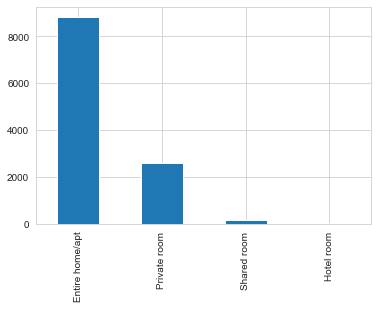

In [72]:
# Let's look at the room_type distribution
print(df['room_type'].value_counts(normalize=True))
df['room_type'].value_counts().plot(kind='bar');

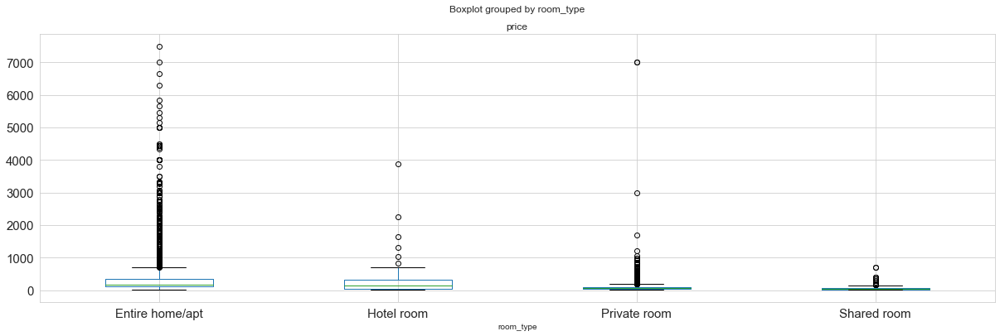

In [73]:
df.boxplot(column='price', by='room_type', figsize=(20,6), fontsize=15)

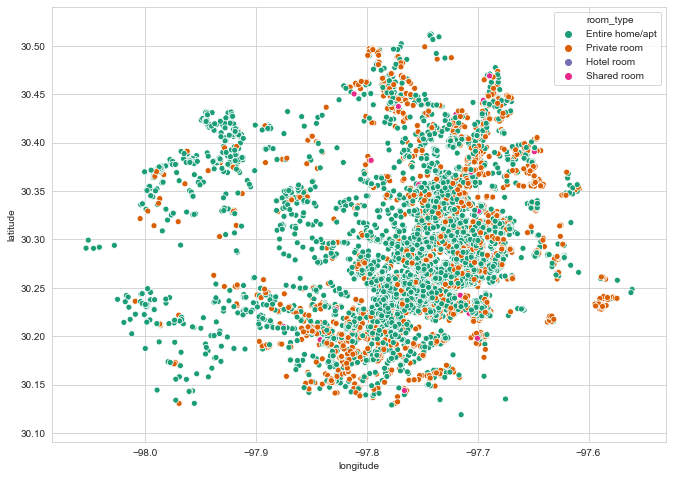

In [74]:
fig, ax = plt.subplots()
fig.set_size_inches(11, 8)
sns.scatterplot(data=df, x='longitude', y='latitude', hue='room_type', palette='Dark2', ax=ax);

In [75]:
#df['lat_long']= list(zip(df['latitude'], df['longitude']))

In [76]:
#df[['lat_long', 'latitude', 'longitude']]

#### Neighbourhood:

East Downtown                 0.100611
Downtown                      0.068742
Travis Heights                0.042709
University of Texas           0.040208
East Riverside                0.034649
Zilker                        0.033445
Bouldin Creek                 0.031406
South Lamar                   0.029461
Barton Hills                  0.026404
MLK & 183                     0.023068
Cherry Creek                  0.022976
South Congress                0.019918
McKinney                      0.019733
Old West Austin               0.018992
Upper Boggy Creek             0.018158
North Loop                    0.017973
West Campus                   0.016583
Holly                         0.015657
Govalle                       0.015564
West Congress                 0.014823
Hyde Park                     0.014452
Hancock                       0.014452
Montopolis                    0.013248
Mueller                       0.013063
Parker Lane                   0.012970
South Manchaca           

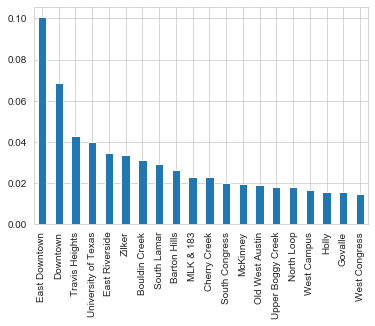

In [77]:
# Let's look at the neighbourhood distribution 
print(df['neighbourhood'].value_counts(normalize=True))
df['neighbourhood'].value_counts(normalize=True)[:20].plot(kind='bar');

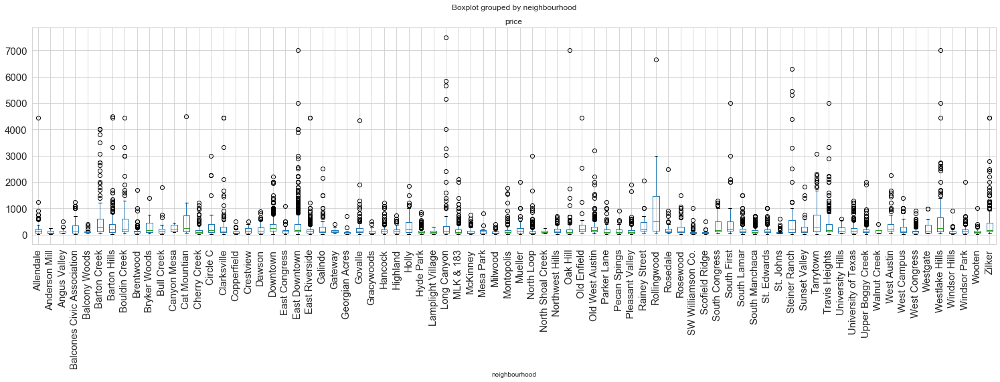

In [78]:
#top_neighbourhoods = df[df['neighbourhood'].value_counts()[:10]]
df.boxplot(column='price', by='neighbourhood', figsize=(25,6), fontsize=15, rot=90)
#op_neighbourhoods = df['neighbourhood'].value_counts()[:10]
#df[top_neighbourhoods].reset_index(df.index)

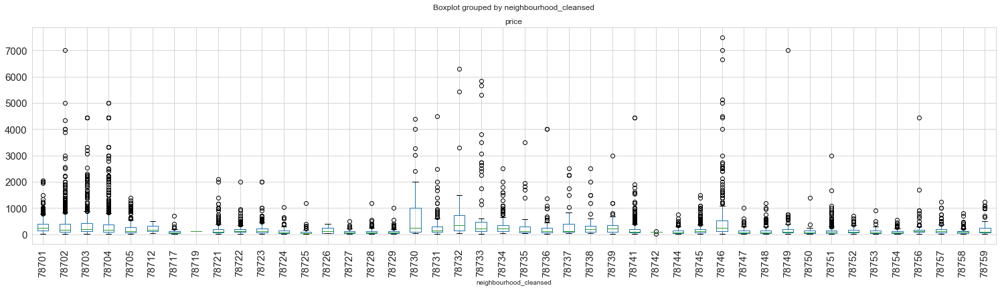

In [79]:
df.boxplot(column='price', by='neighbourhood_cleansed', figsize=(25,6), fontsize=15, rot=90)

In [80]:
print(df[df['neighbourhood'] =='East Downtown']['neighbourhood_cleansed'].value_counts())
print(df[df['neighbourhood'] =='Downtown']['neighbourhood_cleansed'].value_counts())
print(df[df['neighbourhood'] =='Travis Heights']['neighbourhood_cleansed'].value_counts())
print(df[df['neighbourhood'] =='University of Texas']['neighbourhood_cleansed'].value_counts())

78702    1086
Name: neighbourhood_cleansed, dtype: int64
78701    697
78703     44
78721      1
Name: neighbourhood_cleansed, dtype: int64
78704    461
Name: neighbourhood_cleansed, dtype: int64
78705    431
78712      3
Name: neighbourhood_cleansed, dtype: int64


In [81]:
df.last_review.isnull().sum()

2515

In [82]:
df['last_review'] = pd.to_datetime(df['last_review'])

In [83]:
(df.last_review.dt.year >= 2018).sum()

8172

In [84]:
columns_list = ['property_type', 'room_type', 'price', 'accommodates', 'bathrooms', 'bedrooms',  
                'host_is_superhost', 'neighbourhood_cleansed', 'longitude', 'latitude', 
                'number_of_reviews', 'availability_365', 'review_scores_rating', 
                'minimum_nights', 'listing_url']

df = df[columns_list]

In [85]:
df.head()

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,neighbourhood_cleansed,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url
id,,,,,,,,,,,,,,,
2265,House,Entire home/apt,225.0,4,2.0,2.0,t,78702,-97.71398,30.27750,24,0,93.0,30,https://www.airbnb.com/rooms/2265
5245,House,Private room,100.0,2,1.0,1.0,t,78702,-97.71379,30.27577,9,0,91.0,30,https://www.airbnb.com/rooms/5245
5456,Guesthouse,Entire home/apt,95.0,3,1.0,1.0,t,78702,-97.73448,30.26112,529,334,97.0,2,https://www.airbnb.com/rooms/5456
5769,House,Private room,40.0,2,1.0,1.0,t,78729,-97.78422,30.45697,257,14,98.0,1,https://www.airbnb.com/rooms/5769
6413,Guesthouse,Entire home/apt,99.0,2,1.0,0.0,t,78704,-97.73726,30.24829,112,0,99.0,3,https://www.airbnb.com/rooms/6413


C:\Users\rtalebiz\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log



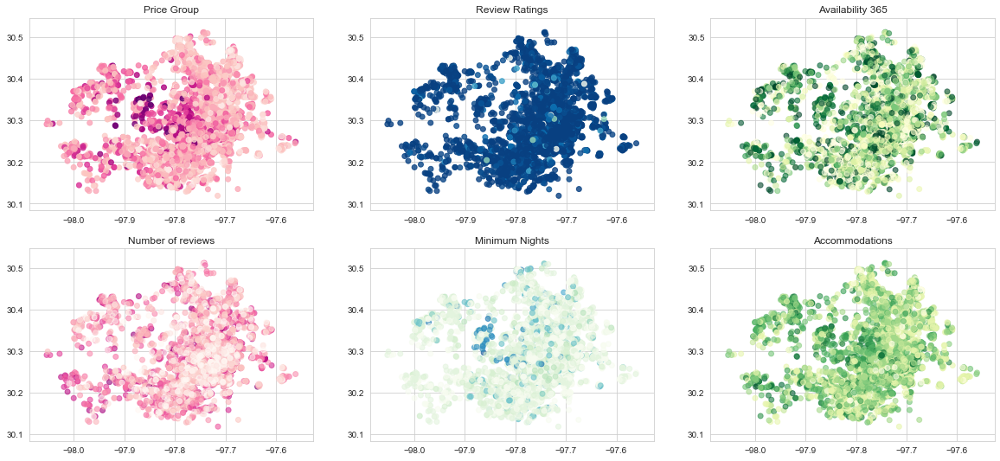

In [86]:
fig, axes = plt.subplots(2, 3, figsize=(20, 9))

axes[0,0].scatter(x=df['longitude'], y=df['latitude'], c=np.log(df['price']), cmap='RdPu', alpha=0.8)
axes[0,0].set_title('Price Group')

axes[0,1].scatter(x=df['longitude'], y=df['latitude'], c=np.log(df['review_scores_rating']), cmap='GnBu', alpha=0.8)
axes[0,1].set_title('Review Ratings')

axes[0,2].scatter(x=df['longitude'], y=df['latitude'], c=df['availability_365'], cmap='YlGn', alpha=0.6)
axes[0,2].set_title('Availability 365')

axes[1,0].scatter(x=df['longitude'], y=df['latitude'], c=np.log(df['number_of_reviews']), cmap='RdPu', alpha=0.6)
axes[1,0].set_title('Number of reviews')

axes[1,1].scatter(x=df['longitude'], y=df['latitude'], c=np.log(df['minimum_nights']), cmap='GnBu', alpha=0.6)
axes[1,1].set_title('Minimum Nights')

axes[1,2].scatter(x=df['longitude'], y=df['latitude'], c=np.log(df['accommodates']), cmap='YlGn', alpha=0.6)
axes[1,2].set_title('Accommodations')

plt.show()

In [87]:
# Compress zipcode into 5 regions for 1 hot encoding
zip_central = [78701, 78703, 78705, 78712,78751, 78756, 78757]
zip_north = [78726, 78727, 78728, 78729, 78731, 78750, 78717, 78758, 78759]
zip_west = [78730, 78732, 78733, 78734, 78735, 78736, 78738, 78746]
zip_south = [78704, 78737, 78739, 78745, 78749, 78748, 78742, 78747, 78744, 78719]
zip_east = [78702, 78721, 78723, 78724, 78725, 78741,78754, 78722, 78753, 78752]

map_dict = {}
str_dict = {0: 'Central', 1: 'North', 2: 'West', 3: 'South', 4: 'East'}
area_list = [zip_central, zip_north, zip_west, zip_south, zip_east]

# Create a dict for the pandas map function to convert zip into region
for i in range(len(area_list)):
    for zipcode in area_list[i]:
        map_dict[zipcode] = str_dict[i]   

# Replace 'neighbourhood_cleansed' with 'region' feature
df['region'] = df['neighbourhood_cleansed'].map(map_dict)
df.drop(['neighbourhood_cleansed'], axis=1, inplace=True)

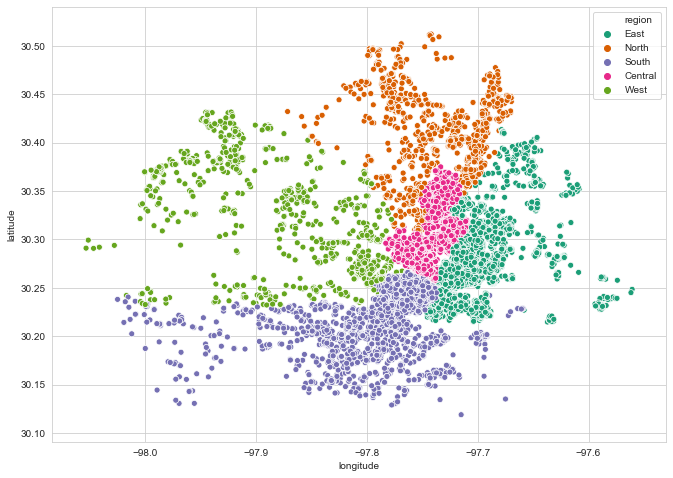

In [88]:
fig, ax = plt.subplots()
fig.set_size_inches(11, 8)
sns.scatterplot(data=df, x='longitude', y='latitude', hue='region', palette='Dark2', ax=ax);

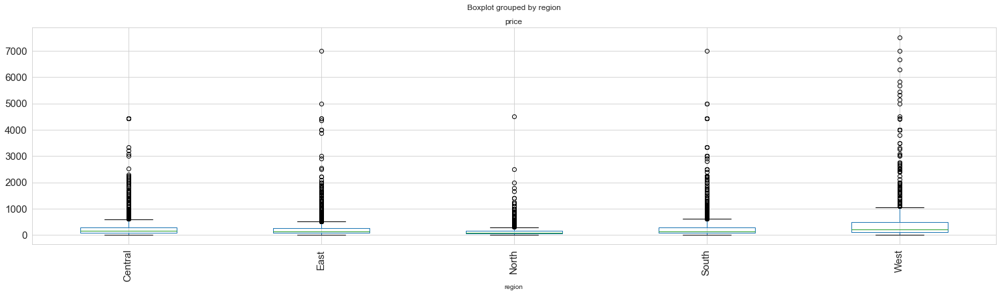

In [89]:
df.boxplot(column='price', by='region', figsize=(25,6), fontsize=15, rot=90)

In [90]:
df[df['region']=='West']['price'].describe()

count     819.000000
mean      514.654457
std       903.878785
min        20.000000
25%       114.000000
50%       219.000000
75%       495.000000
max      7500.000000
Name: price, dtype: float64

In [91]:
df[df['region']=='West']['property_type'].value_counts()

House                424
Apartment            160
Condominium           46
Guesthouse            33
Villa                 25
Guest suite           25
Townhouse             23
Cottage               20
Tiny house             9
Bungalow               9
Camper/RV              8
Boat                   6
Cabin                  4
Bed and breakfast      4
Barn                   3
Loft                   3
Dome house             3
Houseboat              3
Other                  3
Treehouse              2
Farm stay              2
Chalet                 1
Tent                   1
Campsite               1
Boutique hotel         1
Name: property_type, dtype: int64

In [92]:
df[df['region']=='East']['price'].describe()

count    3605.000000
mean      239.700971
std       354.067658
min        16.000000
25%        75.000000
50%       125.000000
75%       250.000000
max      7000.000000
Name: price, dtype: float64

In [93]:
df[df['region']=='East']['property_type'].value_counts()

House                 1906
Apartment              724
Condominium            217
Guesthouse             181
Townhouse              158
Bungalow               124
Guest suite             81
Loft                    41
Tiny house              30
Camper/RV               29
Serviced apartment      26
Cottage                 18
Hostel                  18
Other                   15
Villa                    7
Boutique hotel           6
Aparthotel               6
Farm stay                5
Tent                     3
Tipi                     2
Treehouse                2
Chalet                   1
Cabin                    1
Earth house              1
Yurt                     1
Bed and breakfast        1
Bus                      1
Name: property_type, dtype: int64

In [94]:
df[df['region']=='North']['price'].describe()

count     876.000000
mean      161.062785
std       267.664668
min        20.000000
25%        50.000000
50%        90.000000
75%       150.000000
max      4501.000000
Name: price, dtype: float64

In [95]:
df[df['region']=='North']['property_type'].value_counts()

House                 449
Apartment             256
Condominium            56
Townhouse              48
Guesthouse             20
Guest suite            19
Bungalow                8
Loft                    5
Serviced apartment      3
Villa                   2
Camper/RV               2
Bed and breakfast       1
Tiny house              1
Boutique hotel          1
Cottage                 1
Farm stay               1
Nature lodge            1
Other                   1
Tipi                    1
Name: property_type, dtype: int64

In [96]:
df[df['region']=='South']['price'].describe()

count    3480.000000
mean      278.982471
std       406.558160
min        18.000000
25%        86.000000
50%       145.000000
75%       300.000000
max      7000.000000
Name: price, dtype: float64

In [97]:
df[df['region']=='South']['property_type'].value_counts()

House                 1617
Apartment              961
Condominium            226
Guesthouse             175
Townhouse              141
Guest suite            101
Bungalow                88
Camper/RV               44
Loft                    23
Cottage                 21
Tiny house              19
Boutique hotel          13
Bed and breakfast       11
Serviced apartment      10
Cabin                    8
Villa                    7
Other                    5
Tent                     4
Farm stay                1
Yurt                     1
Hotel                    1
Treehouse                1
Barn                     1
Bus                      1
Name: property_type, dtype: int64

In [98]:
df[df['region']=='Central']['price'].describe()

count    2861.000000
mean      266.783293
std       348.493579
min        16.000000
25%        94.000000
50%       150.000000
75%       300.000000
max      4440.000000
Name: price, dtype: float64

In [99]:
df[df['region']=='Central']['property_type'].value_counts()

Apartment             1006
House                  702
Condominium            521
Guesthouse             129
Serviced apartment     127
Bungalow                69
Loft                    66
Resort                  48
Townhouse               46
Guest suite             44
Boutique hotel          18
Aparthotel              18
Other                   15
Bed and breakfast       14
Cottage                  8
Camper/RV                7
Hostel                   7
Tiny house               5
Villa                    3
Cabin                    3
Yurt                     2
Hotel                    2
Tent                     1
Name: property_type, dtype: int64

In [100]:
df[df['region']== 'East'][['price', 'listing_url']].sort_values(by='price',ascending=False)

,price,listing_url
id,,
42091432,7000.0,https://www.airbnb.com/rooms/42091432
34864514,5000.0,https://www.airbnb.com/rooms/34864514
19329023,4440.0,https://www.airbnb.com/rooms/19329023
18823187,4440.0,https://www.airbnb.com/rooms/18823187
35569192,4350.0,https://www.airbnb.com/rooms/35569192
39889185,3999.0,https://www.airbnb.com/rooms/39889185
17437940,3999.0,https://www.airbnb.com/rooms/17437940
28466259,3875.0,https://www.airbnb.com/rooms/28466259
32364192,3000.0,https://www.airbnb.com/rooms/32364192


In [101]:
df.drop(index=42091432, inplace=True)

In [102]:
df.at[34864514, 'price'] = 429

In [103]:
df[df['region']== 'East'][['price', 'listing_url']].sort_values(by='price',ascending=False)

,price,listing_url
id,,
18823187,4440.0,https://www.airbnb.com/rooms/18823187
19329023,4440.0,https://www.airbnb.com/rooms/19329023
35569192,4350.0,https://www.airbnb.com/rooms/35569192
17437940,3999.0,https://www.airbnb.com/rooms/17437940
39889185,3999.0,https://www.airbnb.com/rooms/39889185
28466259,3875.0,https://www.airbnb.com/rooms/28466259
32364192,3000.0,https://www.airbnb.com/rooms/32364192
15665823,2899.0,https://www.airbnb.com/rooms/15665823
28463789,2550.0,https://www.airbnb.com/rooms/28463789


In [104]:
df[df['region']== 'East']['price'].mean()

236.55688124306326

Noting for cleanup:

* Price needs to be converted to float (This has been done already)
* Missing NaN values need data imputed or rows removed
* Categorical columns need to be converted to dummy variables (get_dummies)
* To continue the data exploration, I need to perform some cleanup procedures. I'll create a cleanup function to put these cleaning steps together.

In [105]:
print("Dataset has {} row entries.".format(df.shape[0]))

Dataset has 11640 row entries.


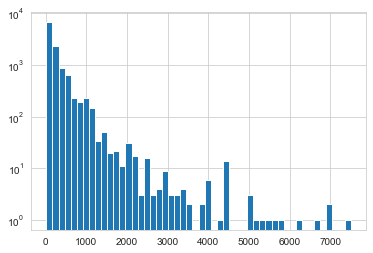

In [106]:
# Let's look at the rental price distribution
fig, ax = plt.subplots()
ax.hist(df['price'], bins=50)
ax.set_yscale("log", nonposy='clip')
plt.show();

There are some oddly high prices (> $2000) that we need to examine to find out if the rental is a large proporty. We'll look at price per person (price / accommodates) to check for outliers.

In [107]:
# Create 'price_per_person' feature
df['price_per_person'] = df['price']/df['accommodates']

df['price_per_person'].value_counts().sort_index(ascending=False).head(15)

1750.000000    1
1500.000000    1
1200.000000    1
1081.000000    1
980.000000     1
937.500000     1
875.000000     1
833.333333     1
815.000000     1
800.000000     1
750.000000     3
740.000000     1
717.000000     1
625.000000     2
623.750000     1
Name: price_per_person, dtype: int64

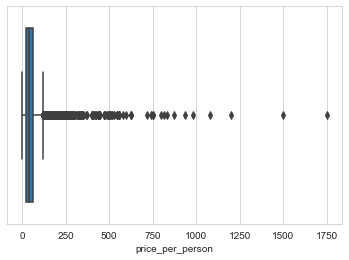

In [108]:
sns.boxplot(df['price_per_person'])

In [109]:
df[df['price_per_person'] > 1500.00][['price', 'number_of_reviews', 'accommodates']].sort_values('price', ascending=False)

,price,number_of_reviews,accommodates
id,,,
925980,7000.0,2,4


In [110]:
df[df['price_per_person'] <= 1500].price.value_counts().sort_index()

16.0       25
18.0        4
19.0        6
20.0       19
21.0        4
22.0       10
23.0       28
24.0        3
25.0       40
26.0       11
27.0       33
28.0       21
29.0       35
30.0       88
31.0       13
32.0       25
33.0       20
34.0       23
35.0      104
36.0       16
37.0       40
38.0       25
39.0       45
40.0      130
41.0       12
42.0       12
43.0       15
44.0       20
45.0      153
46.0        9
47.0       27
48.0       21
49.0       65
50.0      233
51.0       14
52.0       23
53.0       18
54.0       20
55.0      114
56.0       11
57.0       16
58.0       25
59.0       47
60.0      144
61.0       11
62.0       16
63.0       11
64.0       17
65.0      138
66.0       15
67.0       22
68.0       29
69.0       74
70.0      147
71.0       16
72.0       22
73.0       22
74.0       23
75.0      266
76.0       15
77.0       15
78.0       26
79.0       93
80.0      170
81.0       20
82.0       18
83.0       15
84.0       20
85.0      177
86.0       13
87.0        4
88.0  

In [111]:
df.loc[df['price'] == 10000.0]

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url,region,price_per_person
id,,,,,,,,,,,,,,,,


Upon reviewing the url listings, the houses listed as with extreme prices looked like automated (or unmaintained) listings with little to no reviews with some being incorrectly priced at the time of the source data scrape. I'm opting to remove them from this analysis since they don't pass my common sense as a consumer. However, it would be intersting to examine other popular cities to see if they had similar outliers.

In [112]:
# remove rows with > $1000 per person
df = df.loc[df['price_per_person'] <= 1500.00]

# verify removal
df['price_per_person'].value_counts().sort_index(ascending=False).head()

1500.0    1
1200.0    1
1081.0    1
980.0     1
937.5     1
Name: price_per_person, dtype: int64

In [113]:
df.describe()

,price,accommodates,bathrooms,bedrooms,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,price_per_person
count,11639.000000,11639.000000,11626.000000,11624.000000,11639.000000,11639.000000,11639.000000,11639.000000,8996.000000,11639.000000,11639.000000
mean,269.977661,4.701607,1.544985,1.787251,-97.751155,30.278137,31.764413,134.244695,95.972877,5.290489,57.299554
std,420.240078,3.237634,0.873651,1.268649,0.056404,0.057408,63.644257,134.516911,7.206132,16.642199,68.050180
min,16.000000,1.000000,0.000000,0.000000,-98.053550,30.118850,0.000000,0.000000,20.000000,1.000000,1.727273
25%,80.000000,2.000000,1.000000,1.000000,-97.767205,30.244365,1.000000,0.000000,95.000000,1.000000,25.000000
50%,139.000000,4.000000,1.000000,1.000000,-97.744810,30.266860,7.000000,87.000000,98.000000,2.000000,37.500000
75%,295.500000,6.000000,2.000000,2.000000,-97.721365,30.298530,32.000000,268.000000,100.000000,2.000000,62.500000
max,7500.000000,33.000000,17.000000,23.000000,-97.560620,30.512280,947.000000,365.000000,100.000000,500.000000,1500.000000


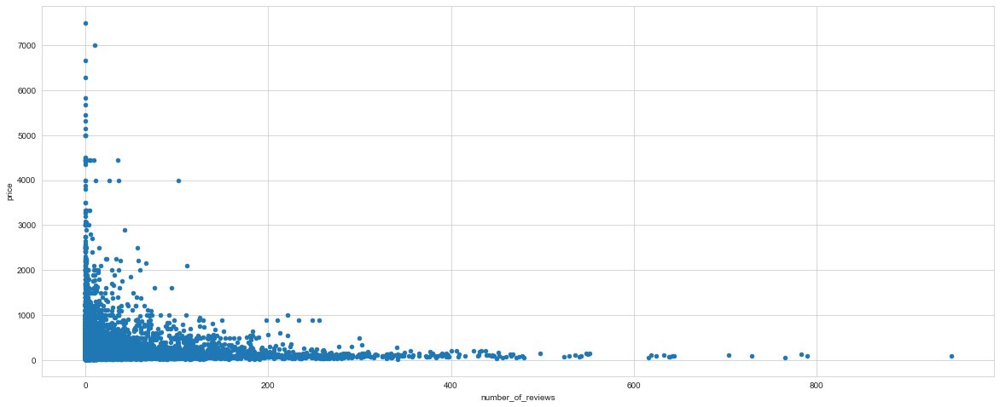

In [114]:
df.plot.scatter(x='number_of_reviews', y='price', figsize=(20,8))

In [115]:
df[df['number_of_reviews']==0][['price', 'listing_url']].sort_values(by='price', ascending=False)

,price,listing_url
id,,
14055197,7500.0,https://www.airbnb.com/rooms/14055197
19329030,6660.0,https://www.airbnb.com/rooms/19329030
36880518,6291.0,https://www.airbnb.com/rooms/36880518
36874172,5832.0,https://www.airbnb.com/rooms/36874172
36909759,5669.0,https://www.airbnb.com/rooms/36909759
39272801,5443.0,https://www.airbnb.com/rooms/39272801
41338669,5314.0,https://www.airbnb.com/rooms/41338669
36915288,5139.0,https://www.airbnb.com/rooms/36915288
7618643,5000.0,https://www.airbnb.com/rooms/7618643


In [116]:
df[df['number_of_reviews']==0]['price'].sort_values(ascending=False)

id
14055197    7500.0
19329030    6660.0
36880518    6291.0
36874172    5832.0
36909759    5669.0
39272801    5443.0
41338669    5314.0
36915288    5139.0
2183136     5000.0
7618643     5000.0
36868497    4999.0
41339206    4501.0
36172188    4500.0
19329023    4440.0
20050204    4440.0
21011562    4440.0
20990622    4440.0
41339201    4399.0
35569192    4350.0
35936939    4000.0
36874378    3999.0
28466259    3875.0
33613775    3799.0
36868035    3499.0
41961095    3499.0
41886949    3330.0
42384778    3300.0
36903761    3266.0
5122828     3200.0
36868599    3079.0
33614203    3025.0
42881415    3000.0
42883227    3000.0
20666269    3000.0
11475165    3000.0
36874426    2749.0
33613793    2749.0
33613814    2749.0
37078495    2639.0
33614329    2598.0
28463789    2550.0
36873295    2528.0
39272850    2528.0
7853960     2500.0
32867155    2500.0
28914565    2500.0
2459312     2500.0
2345033     2500.0
33615928    2499.0
18071797    2495.0
33614280    2419.0
33613970    2419.0
40463942 

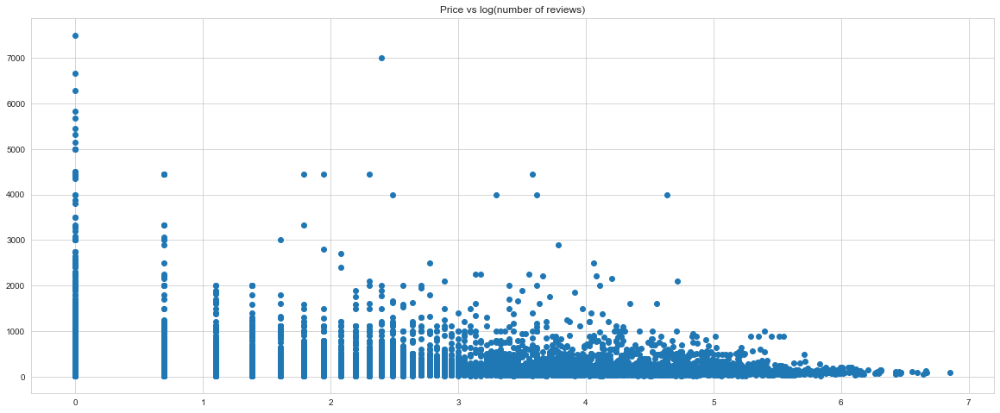

In [117]:
plt.figure(figsize=(20,8))
plt.scatter(np.log(1+df['number_of_reviews']), df['price'])
plt.title('Price vs log(number of reviews)');

The review ratings (review_scores_rating) are missing a lot of data. However, due to the small size of the data set, I'll opt to fill the missing values of the ratings scores at the cost of diluting the ratings feature importance. Before I do this, I'll save a copy of the DataFrame in it's current state since I want to look at a plot of price vs. rating later.

In [118]:
# Imputed mean value of review scores to missing data in review_scores_rating feature
print("Filling NaN 'review_scores_rating' with {:.3f}.".format(df['review_scores_rating'].mean()))
df['review_scores_rating'].fillna((df['review_scores_rating'].mean()), inplace=True)

Filling NaN 'review_scores_rating' with 95.973.


The bathrooms feature is missing some data. I'll update the NaNs based on the standard ratio of the number of bathrooms needed in a home which is two for every three rooms. I'll assign a bathroom for every 2 people.

#### Bathrooms:

In [119]:
df['bathrooms'].isnull().sum()

13

In [120]:
df.groupby(df['bathrooms']== 0).size()

bathrooms
False    11606
True        33
dtype: int64

In [121]:
df['bedrooms'].isnull().sum()

15

In [122]:
df.groupby(df['bedrooms']== 0).size()

bedrooms
False    10933
True       706
dtype: int64

In [123]:
# Replacing all 0 values in bathrooms with 'NaN'
df['bathrooms'].replace(0, np.nan, inplace=True)
df['bathrooms'].fillna(df.groupby(df['accommodates'])['bathrooms'].transform('median'), inplace=True)

In [124]:
# Bathrooms is getting scaled later, so I do not care about making it a discrete value
# Also 0.5 is commonly known as a 'half-bath'
#df['bathrooms'].fillna((df['accommodates']//2), inplace=True)

In [125]:
# Check to make sure bathrooms NaN values have been filled correctly. 
df.loc[[314152]]

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url,region,price_per_person
id,,,,,,,,,,,,,,,,
314152,Apartment,Entire home/apt,350.0,4,1.0,2.0,f,-97.79621,30.35672,0,0,95.972877,4,https://www.airbnb.com/rooms/314152,West,87.5


In [126]:
df[df['accommodates'] == 4]['bathrooms'].mean()

1.2534642032332564

In [127]:
df[df['bedrooms'] == 4]['bathrooms'].mean()

2.816473988439306

In [128]:
df[df['accommodates']== 4]['bedrooms'].median()

1.0

In [129]:
df[df['accommodates'] == 3]['bathrooms'].mean()

1.0704521556256572

In [130]:
df['accommodates'].isnull().sum()

0

In [131]:
df.groupby(df['accommodates']== 0).size()

accommodates
False    11639
dtype: int64

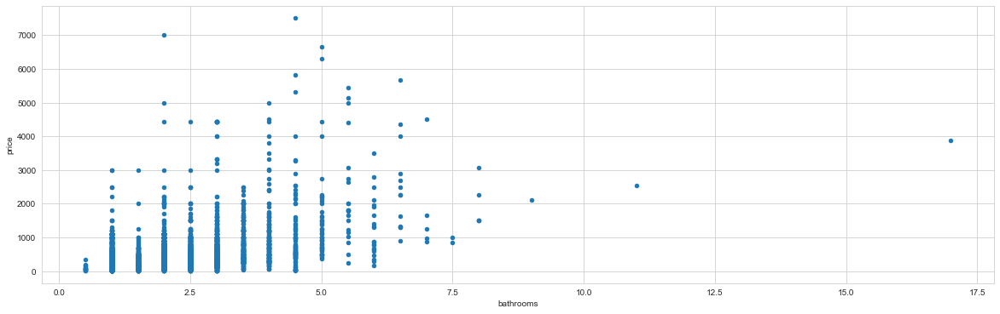

In [132]:
df.plot.scatter(x='bathrooms', y='price', figsize=(20,6))

In [133]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11639 entries, 2265 to 42931550
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   property_type         11639 non-null  object 
 1   room_type             11639 non-null  object 
 2   price                 11639 non-null  float64
 3   accommodates          11639 non-null  int64  
 4   bathrooms             11639 non-null  float64
 5   bedrooms              11624 non-null  float64
 6   host_is_superhost     11637 non-null  object 
 7   longitude             11639 non-null  float64
 8   latitude              11639 non-null  float64
 9   number_of_reviews     11639 non-null  int64  
 10  availability_365      11639 non-null  int64  
 11  review_scores_rating  11639 non-null  float64
 12  minimum_nights        11639 non-null  int64  
 13  listing_url           11639 non-null  object 
 14  region                11639 non-null  object 
 15  price_per_per

In [134]:
df.isnull().sum()

property_type            0
room_type                0
price                    0
accommodates             0
bathrooms                0
bedrooms                15
host_is_superhost        2
longitude                0
latitude                 0
number_of_reviews        0
availability_365         0
review_scores_rating     0
minimum_nights           0
listing_url              0
region                   0
price_per_person         0
dtype: int64

#### Bedrooms:

In [135]:
df[df['bedrooms'].isnull()].head()

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url,region,price_per_person
id,,,,,,,,,,,,,,,,
38819415,Camper/RV,Entire home/apt,100.0,2,1.0,NaN,f,-97.73815,30.27715,0,177,95.972877,5,https://www.airbnb.com/rooms/38819415,Central,50.0
38955548,Apartment,Entire home/apt,100.0,2,1.0,NaN,t,-97.76369,30.25503,28,31,99.000000,2,https://www.airbnb.com/rooms/38955548,South,50.0
40171545,Apartment,Entire home/apt,80.0,4,1.0,NaN,f,-97.70992,30.28476,4,88,100.000000,1,https://www.airbnb.com/rooms/40171545,East,20.0
42145069,Apartment,Entire home/apt,80.0,2,1.0,NaN,t,-97.72143,30.39580,5,344,100.000000,1,https://www.airbnb.com/rooms/42145069,North,40.0
42485149,Guesthouse,Entire home/apt,85.0,2,1.0,NaN,f,-97.67123,30.31082,0,259,95.972877,1,https://www.airbnb.com/rooms/42485149,East,42.5


In [136]:
(df['bathrooms'] == 0).sum()

0

In [137]:
df[df['bedrooms'] == 0]

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url,region,price_per_person
id,,,,,,,,,,,,,,,,
6413,Guesthouse,Entire home/apt,99.0,2,1.0,0.0,t,-97.73726,30.24829,112,0,99.000000,3,https://www.airbnb.com/rooms/6413,South,49.500000
56690,Apartment,Entire home/apt,150.0,2,1.0,0.0,t,-97.75121,30.24440,169,77,99.000000,2,https://www.airbnb.com/rooms/56690,South,75.000000
141550,Guesthouse,Entire home/apt,111.0,3,1.0,0.0,t,-97.72709,30.25582,439,163,97.000000,1,https://www.airbnb.com/rooms/141550,East,37.000000
219168,Apartment,Entire home/apt,250.0,2,1.0,0.0,f,-97.74531,30.24503,180,0,100.000000,2,https://www.airbnb.com/rooms/219168,South,125.000000
224603,Guesthouse,Entire home/apt,105.0,2,1.0,0.0,f,-97.72679,30.30788,104,102,99.000000,30,https://www.airbnb.com/rooms/224603,Central,52.500000
343889,Apartment,Entire home/apt,35.0,2,1.0,0.0,f,-97.72249,30.27452,19,248,99.000000,30,https://www.airbnb.com/rooms/343889,East,17.500000
485360,Condominium,Entire home/apt,135.0,2,1.0,0.0,t,-97.72854,30.26980,79,169,99.000000,2,https://www.airbnb.com/rooms/485360,East,67.500000
717042,Guesthouse,Entire home/apt,75.0,3,1.0,0.0,t,-97.75288,30.32212,93,66,99.000000,2,https://www.airbnb.com/rooms/717042,North,25.000000
735226,Condominium,Entire home/apt,59.0,2,1.0,0.0,f,-97.74407,30.25244,3,332,100.000000,90,https://www.airbnb.com/rooms/735226,South,29.500000


In [138]:
df[df['bedrooms'] == 0].room_type.value_counts()

Entire home/apt    663
Private room        43
Name: room_type, dtype: int64

In [139]:
df[df['bedrooms'] == 0].accommodates.value_counts()

2     367
4     173
3     123
1      14
5      12
6       8
8       3
11      2
10      2
12      1
7       1
Name: accommodates, dtype: int64

In [140]:
# Replacing all 0 values in bedrooms with 'NaN'
df['bedrooms'].replace(0, np.nan, inplace=True)

In [141]:
df['bedrooms'].fillna(df.groupby(df['accommodates'])['bedrooms'].transform('median'), inplace=True)

In [142]:
df.loc[42852666]

property_type                                     Condominium
room_type                                     Entire home/apt
price                                                     220
accommodates                                                4
bathrooms                                                   1
bedrooms                                                    1
host_is_superhost                                           f
longitude                                            -97.7472
latitude                                              30.2709
number_of_reviews                                           0
availability_365                                          273
review_scores_rating                                  95.9729
minimum_nights                                              3
listing_url             https://www.airbnb.com/rooms/42852666
region                                                Central
price_per_person                                           55
Name: 42

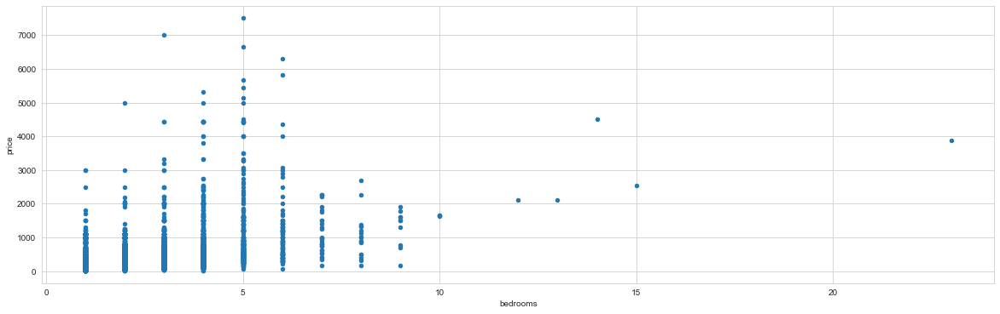

In [143]:
df.plot.scatter(x='bedrooms', y='price', figsize=(20,6))

In [144]:
# Drop the few remaining rows with missing values
df.dropna(inplace=True)

The data set severly lacks in samples for larger houses. I'm going to remove some of the extreme rows for these cases since I'm more interested in examining typically sized houses. Another study could be done for very large rental using data from all over the US.

In [145]:
df['bathrooms'].value_counts().sort_index(ascending=False)

17.0       1
11.0       1
9.0        1
8.0        5
7.5        2
7.0        5
6.5       13
6.0       21
5.5       21
5.0       47
4.5       79
4.0      141
3.5      186
3.0      418
2.5      775
2.0     2270
1.5      761
1.0     6876
0.5       14
Name: bathrooms, dtype: int64

In [146]:
df.groupby('bathrooms').price.median()

bathrooms
0.5       70.5
1.0      102.0
1.5      100.0
2.0      242.0
2.5      300.0
3.0      495.0
3.5      600.0
4.0      722.0
4.5      700.0
5.0     1100.0
5.5     1800.0
6.0      875.0
6.5     2250.0
7.0     1250.0
7.5      920.0
8.0     1500.0
9.0     2100.0
11.0    2550.0
17.0    3875.0
Name: price, dtype: float64

In [147]:
df['accommodates'].value_counts().sort_index(ascending=False)

33       1
32       2
30       1
28       2
25       1
24       4
21       3
20       2
19       2
18       4
17       1
16     245
15      27
14      79
13      30
12     178
11      41
10     425
9      103
8      681
7      250
6     1674
5      635
4     2598
3      951
2     3241
1      456
Name: accommodates, dtype: int64

In [148]:
df.groupby('accommodates').price.mean()

accommodates
1       78.879386
2      116.376736
3      138.297581
4      233.340262
5      236.398425
6      315.376344
7      347.716000
8      529.753304
9      505.844660
10     691.345882
11     618.487805
12     714.078652
13     629.366667
14     918.518987
15     985.740741
16     860.481633
17    1170.000000
18    1600.000000
19    1740.000000
20    2387.500000
21    1722.000000
24    1404.250000
25     633.000000
28    1370.000000
30    2749.000000
32    1882.500000
33    1780.000000
Name: price, dtype: float64

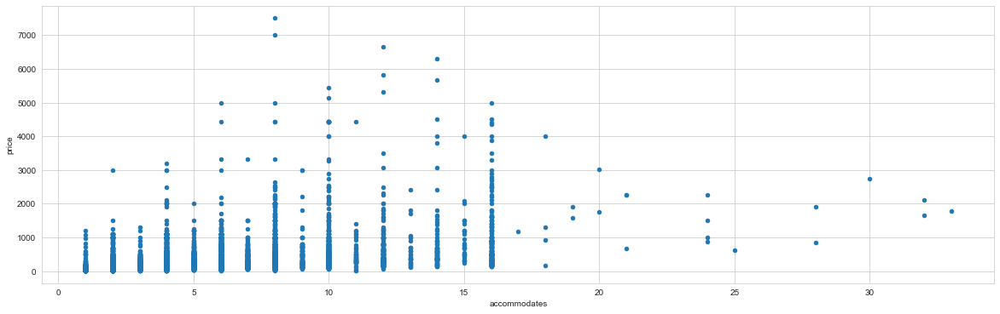

In [149]:
df.plot.scatter(x='accommodates', y='price', figsize=(20,6));

In [150]:
print(df[df['bathrooms'] <= 8])
print(df[df['accommodates'] <= 16])
# Remove extremely large rental listing due to low samples
df = df.loc[df['bathrooms'] <= 8]
df = df.loc[df['accommodates'] <= 16]

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



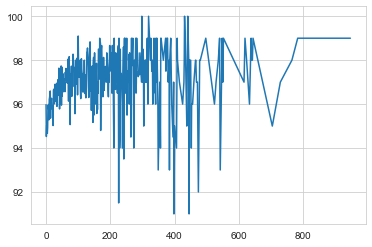

In [151]:
plt.plot(df.groupby('number_of_reviews').review_scores_rating.mean());

### Verify Data Quality
Need to verify that price is a float, review_scores_rating are not missing any values.

In [152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11611 entries, 2265 to 42931550
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   property_type         11611 non-null  object 
 1   room_type             11611 non-null  object 
 2   price                 11611 non-null  float64
 3   accommodates          11611 non-null  int64  
 4   bathrooms             11611 non-null  float64
 5   bedrooms              11611 non-null  float64
 6   host_is_superhost     11611 non-null  object 
 7   longitude             11611 non-null  float64
 8   latitude              11611 non-null  float64
 9   number_of_reviews     11611 non-null  int64  
 10  availability_365      11611 non-null  int64  
 11  review_scores_rating  11611 non-null  float64
 12  minimum_nights        11611 non-null  int64  
 13  listing_url           11611 non-null  object 
 14  region                11611 non-null  object 
 15  price_per_per

### Data Preparation 
The data preparation process in the CRISP-DM cycle consists of:

* Select your data
* Clean your data
* Construct required data
* Integrate data (not required for this project)

#### Select your data
* This is the stage of the project where you decide on the data that you're going to use for analysis. [source](https://www.sv-europe.com/crisp-dm-methodology/). To answer the business questions posed at the beginning, I'm choosing to keep the following features:

* 'price' - target feature for the business questions
* 'room_type' - property type: house, private room, shared room
* 'accommodates' - property size metric
* 'bathrooms' - property size metric
* 'bedrooms' - property size metric
* 'host_is_superhost' - Airbnb host status
* 'neighbourhood_cleansed' - Location, ZIP code
* 'number_of_reviews' - Review metric
* 'review_scores_rating' - Review metric
* 'minimum_nights' - length of stay metric

#### Clean your data
This task involves raise the data quality to the level required by the analysis techniques that you've selected [source](https://www.sv-europe.com/crisp-dm-methodology/). I'm creating a 'cleaning' function so that I don't have to repeat the above steps everytime I load the notebook.

In [153]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11611 entries, 2265 to 42931550
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   property_type         11611 non-null  object 
 1   room_type             11611 non-null  object 
 2   price                 11611 non-null  float64
 3   accommodates          11611 non-null  int64  
 4   bathrooms             11611 non-null  float64
 5   bedrooms              11611 non-null  float64
 6   host_is_superhost     11611 non-null  object 
 7   longitude             11611 non-null  float64
 8   latitude              11611 non-null  float64
 9   number_of_reviews     11611 non-null  int64  
 10  availability_365      11611 non-null  int64  
 11  review_scores_rating  11611 non-null  float64
 12  minimum_nights        11611 non-null  int64  
 13  listing_url           11611 non-null  object 
 14  region                11611 non-null  object 
 15  price_per_per

In [154]:
#df_no_impute.count()

In [155]:
#df_zeros_impute.count()

### Construct required data
This task includes constructive data preparation operations such as the production of derived attributes or entire new records, or transformed values for existing attributes. source

Now that the DataFrame is cleaned, I want to sort all of the ZIP codes for Austin the into several regions to simplify the analysis. This could be easily updated for anyone who wants to redraw my subjective boundaries. Also, for a different city, the following would need to be redone with the appropriate ZIP codes.

Additionally, I need to create dummy variables and scale the features for the regression models.

In [156]:
df.head()

,property_type,room_type,price,accommodates,bathrooms,bedrooms,host_is_superhost,longitude,latitude,number_of_reviews,availability_365,review_scores_rating,minimum_nights,listing_url,region,price_per_person
id,,,,,,,,,,,,,,,,
2265,House,Entire home/apt,225.0,4,2.0,2.0,t,-97.71398,30.27750,24,0,93.0,30,https://www.airbnb.com/rooms/2265,East,56.250000
5245,House,Private room,100.0,2,1.0,1.0,t,-97.71379,30.27577,9,0,91.0,30,https://www.airbnb.com/rooms/5245,East,50.000000
5456,Guesthouse,Entire home/apt,95.0,3,1.0,1.0,t,-97.73448,30.26112,529,334,97.0,2,https://www.airbnb.com/rooms/5456,East,31.666667
5769,House,Private room,40.0,2,1.0,1.0,t,-97.78422,30.45697,257,14,98.0,1,https://www.airbnb.com/rooms/5769,North,20.000000
6413,Guesthouse,Entire home/apt,99.0,2,1.0,1.0,t,-97.73726,30.24829,112,0,99.0,3,https://www.airbnb.com/rooms/6413,South,49.500000


In [157]:
print (np.corrcoef(df['bedrooms'], df['accommodates']))

[[1.         0.82602447]
 [0.82602447 1.        ]]


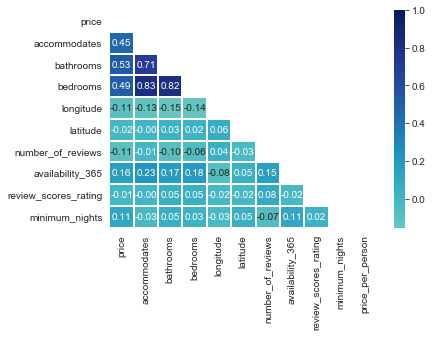

In [158]:
#Create the correlation matrix
corr= df.corr()[:10]
# Draw the heatmap

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Add the mask to the heatmap
sns.heatmap(corr, mask=mask, cmap="YlGnBu", center=0, linewidths=1, annot=True, fmt=".2f")
plt.show()


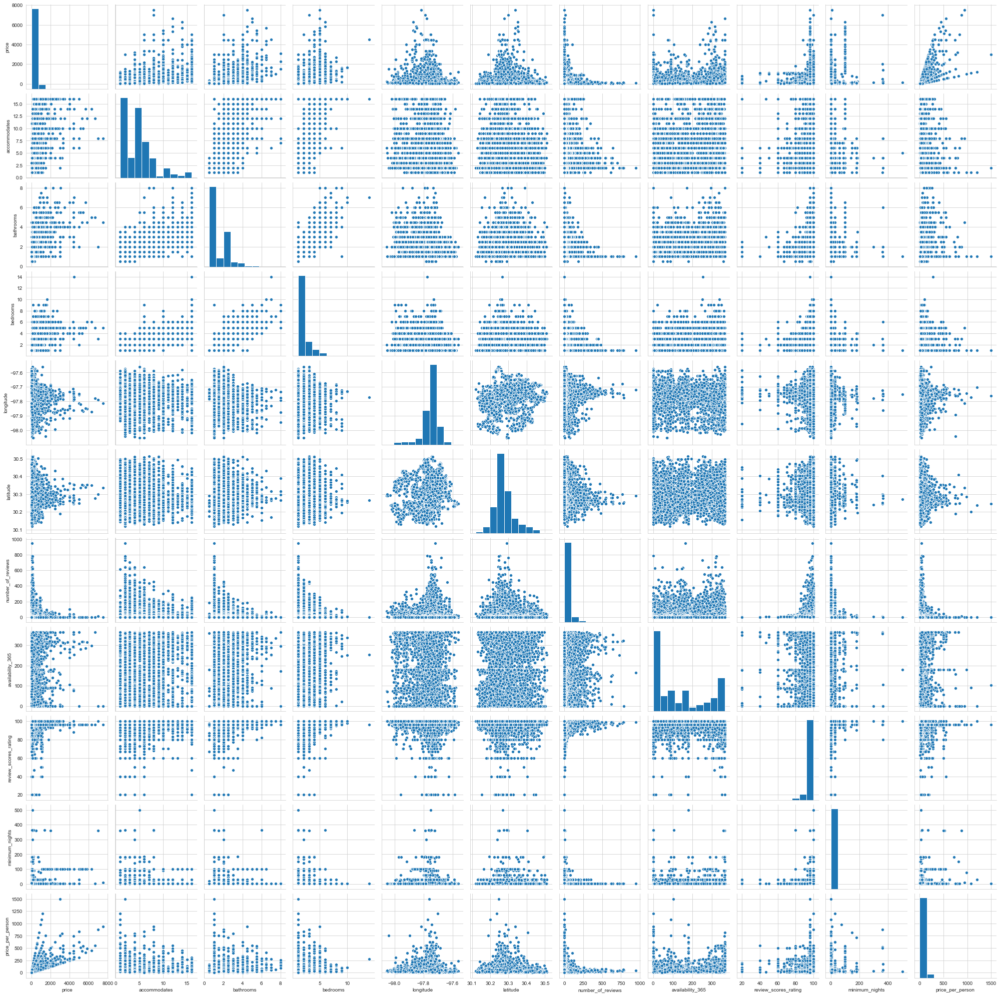

In [159]:
sns.pairplot(df)

In [160]:
#df.loc[19840835]['price']

In [161]:
df.groupby('property_type')['price'].size()

property_type
Aparthotel              23
Apartment             3104
Barn                     4
Bed and breakfast       31
Boat                     6
Boutique hotel          38
Bungalow               298
Bus                      2
Cabin                   16
Camper/RV               90
Campsite                 1
Chalet                   2
Condominium           1066
Cottage                 68
Dome house               3
Earth house              1
Farm stay                9
Guest suite            270
Guesthouse             538
Hostel                  25
Hotel                    3
House                 5075
Houseboat                3
Loft                   138
Nature lodge             1
Other                   39
Resort                  48
Serviced apartment     166
Tent                     9
Tiny house              64
Tipi                     3
Townhouse              415
Treehouse                5
Villa                   43
Yurt                     4
Name: price, dtype: int64

In [162]:
for pt in df['property_type']:
    unique_percent_counts = df['property_type'].value_counts()
    
    top_frequent_indexes = unique_percent_counts[:20].index.values.tolist()
    x = df['property_type'].copy()
    x[~x.isin(top_frequent_indexes)] = 'OTHER'
    
    df['property_type'] = x
df['property_type'].value_counts()

House                 5075
Apartment             3104
Condominium           1066
Guesthouse             538
Townhouse              415
Bungalow               298
Guest suite            270
Serviced apartment     166
Loft                   138
Camper/RV               90
OTHER                   72
Cottage                 68
Tiny house              64
Resort                  48
Villa                   43
Other                   39
Boutique hotel          38
Bed and breakfast       31
Hostel                  25
Aparthotel              23
Name: property_type, dtype: int64

In [163]:
#df = df[df['property_type'] != 'OTHER']

In [164]:
df['property_type'].value_counts()

House                 5075
Apartment             3104
Condominium           1066
Guesthouse             538
Townhouse              415
Bungalow               298
Guest suite            270
Serviced apartment     166
Loft                   138
Camper/RV               90
OTHER                   72
Cottage                 68
Tiny house              64
Resort                  48
Villa                   43
Other                   39
Boutique hotel          38
Bed and breakfast       31
Hostel                  25
Aparthotel              23
Name: property_type, dtype: int64

In [165]:
df.to_csv('data/listings_cleaned.csv')

In [166]:
df.isnull().sum()

property_type           0
room_type               0
price                   0
accommodates            0
bathrooms               0
bedrooms                0
host_is_superhost       0
longitude               0
latitude                0
number_of_reviews       0
availability_365        0
review_scores_rating    0
minimum_nights          0
listing_url             0
region                  0
price_per_person        0
dtype: int64

In [167]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11611 entries, 2265 to 42931550
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   property_type         11611 non-null  object 
 1   room_type             11611 non-null  object 
 2   price                 11611 non-null  float64
 3   accommodates          11611 non-null  int64  
 4   bathrooms             11611 non-null  float64
 5   bedrooms              11611 non-null  float64
 6   host_is_superhost     11611 non-null  object 
 7   longitude             11611 non-null  float64
 8   latitude              11611 non-null  float64
 9   number_of_reviews     11611 non-null  int64  
 10  availability_365      11611 non-null  int64  
 11  review_scores_rating  11611 non-null  float64
 12  minimum_nights        11611 non-null  int64  
 13  listing_url           11611 non-null  object 
 14  region                11611 non-null  object 
 15  price_per_per

In [168]:
def clean_listings_data(csv, review_impute = True):
    '''
    Takes a listings.csv file (insideairbnb.com) for a particular
    city and outputs a cleaned the data frame 
    for the feature_list defined below. Note that the feature_list
    is hardcoded since the cleaning operations may not work for a
    different set of features. 
    
    Input:
    csv - insideairbnb.com listings.csv 
    review_impute - create additional DataFrames with no or '0' imputation 
                    for NaNs in the 'review_scores_rating' column
    
    Output:
    df - Cleaned DataFrame, used for prediction model
    df_no_impute - DataFrame with no imputed values on 'review_scores_rating'
    df_zeros_impute - DataFrame with integer '0' imputed values on 'review_scores_rating'
    '''
    
    # Import and load data
    df = pd.read_csv('data/listings.csv', low_memory=False)
    
    # Select features to keep in DataFrame
    feature_list = ['room_type', 'price', 'accommodates', 'bathrooms', 
                    'bedrooms', 'host_is_superhost', 'neighbourhood_cleansed', 
                    'number_of_reviews', 'review_scores_rating', 'minimum_nights']
    df = df[feature_list]
    
    # Convert price to from currency to float
    df['price'] = df['price'].str.replace('$', '')
    df['price'] = df['price'].str.replace(',', '')
    df['price'] = df['price'].astype(float)
    
    # Create feature for price per person
    df['price_per_person'] = df['price']/df['accommodates']
    
    # Remove rows with > $1000 per person
    df = df.loc[df['price_per_person'] <= 1500.00]
    
    # df for specific plots - need data before 'review_scores_rating' imputation
    df_no_impute = df[['review_scores_rating', 'price', 'price_per_person', 
                    'number_of_reviews', 'bathrooms', 'bedrooms', 'accommodates']].copy()
    df_zeros_impute = df_no_impute.copy()
    df_no_impute.dropna(inplace=True)
    df_zeros_impute['review_scores_rating'].fillna(0, inplace=True)
    df_zeros_impute.dropna(inplace=True)

    # Imputed mean value of review scores to missing data in review_scores_rating feature
    df['review_scores_rating'].fillna((df['review_scores_rating'].mean()), inplace=True)
    
    # Bathrooms is getting scaled later, so I do not care about making it a discrete value
    # Replacing all 0 values in bathrooms with 'NaN'
    df['bathrooms'].replace(0, np.nan, inplace=True)
    df['bathrooms'].fillna((df['accommodates']//2), inplace=True)
    
    df['bedrooms'].replace(0, np.nan, inplace=True)
    df['bedrooms'].fillna((df['accommodates']//2), inplace=True)
    
    # Drop the few remaining rows with missing values
    df.dropna(inplace=True)
    
    # Remove extremely large rental listing due to low samples
    df = df.loc[df['bathrooms'] <= 8]
    df = df.loc[df['accommodates'] <= 16]
    
    print('clean_listings_data: Cleaning Complete')
    
    if review_impute:
        return df, df_no_impute, df_zeros_impute
    else:
        return df

# Run cleanup function
#df, df_no_impute, df_zeros_impute = clean_listings_data('data/listings.csv')